In [2]:
from fastbook import *

#### Extracting and cleaning the data

We will download images using bing.

In [3]:
key = os.environ.get('AZURE_SEARCH_KEY', '8012860feab84ac38b2525e249158cf0')

In [4]:
search_images_bing

<function fastbook.search_images_bing(key, term, min_sz=128, max_images=150)>

In [5]:
results = search_images_bing(key, "grizzly bear")

In [12]:
ims = results.attrgot("contentUrl")

In [14]:
type(ims)

fastcore.foundation.L

In [15]:
len(ims)

150

In [21]:
dest = "images/grizzly.jpg"
download_url(ims[10], dest)

Path('images/grizzly.jpg')

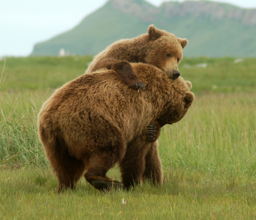

In [22]:
im = Image.open(dest)
im.to_thumb(256, 256)

In [23]:
bear_types = "grizzly", "black","teddy"
path = Path("bears")

In [24]:
type(bear_types)

tuple

In [25]:
if not path.exists():
  path.mkdir()
  for o in bear_types:
    dest = (path/o)
    dest.mkdir(exist_ok=True)
    results = search_images_bing(key, f'{0} bear')
    download_images(dest, urls=results.attrgot("contentUrl"))

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


In [27]:
fns = get_image_files(path)
len(fns)

424

In [28]:
failed = verify_images(fns)
len(failed)

11

In [30]:
failed.map(Path.unlink)

(#11) [None,None,None,None,None,None,None,None,None,None...]

In [32]:
!pip install nbdev

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.1/66.1 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.0/83.0 kB 7.9 MB/s eta 0:00:00


In [34]:
doc(verify_images)

In [36]:
doc(DataLoaders)

In [37]:
class DataLoaders(GetAttr):
  def __init__(self, *loaders): self.loaders = loaders
  def __getitem__(self, i): return self.loaders[i]
  train, valid = add_props(lambda i, self: self[i])

In [38]:
bears = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct = 0.2, seed = 42),
    get_y = parent_label,
    item_tfms = Resize(128)
)

In [42]:
dls = bears.dataloaders(path)

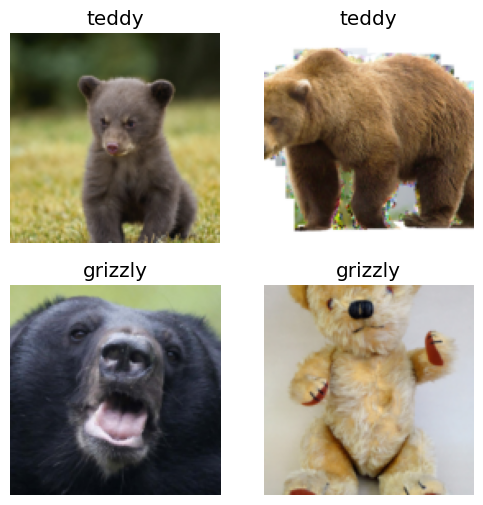

In [44]:
dls.valid.show_batch(max_n=4, nrows=2)

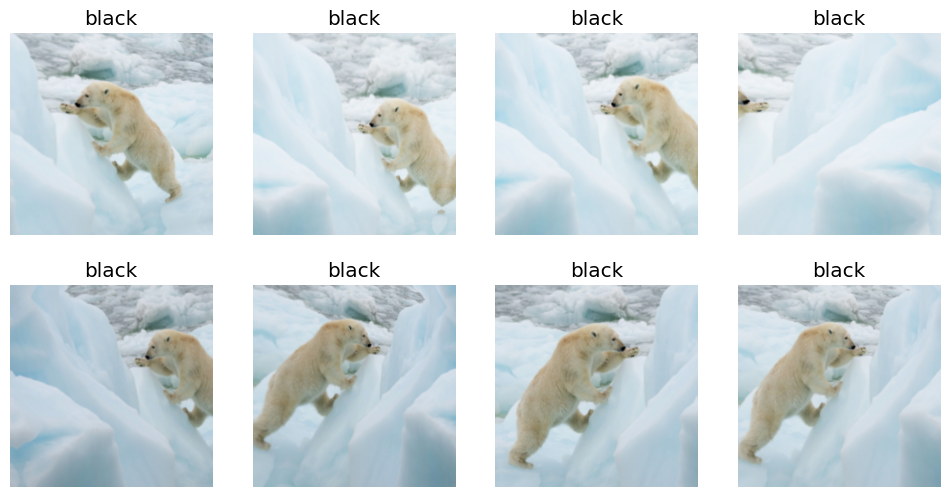

In [46]:
bears = bears.new(item_tfms=RandomResizedCrop(224, min_scale=0.5), batch_tfms=aug_transforms())
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [47]:
learn = vision_learner(dls, resnet18, metrics = error_rate)
learn.fine_tune(5)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 56.3MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,2.084018,2.268255,0.743902,01:22


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


epoch,train_loss,valid_loss,error_rate,time
0,2.055432,1.978211,0.780488,02:10
1,1.987374,1.995564,0.817073,01:50
2,1.953356,2.271738,0.865854,01:47
3,1.901711,2.451772,0.902439,01:51
4,1.885035,2.488966,0.902439,01:47


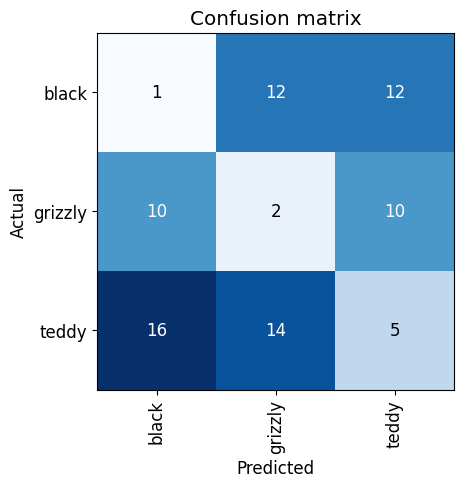

In [48]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

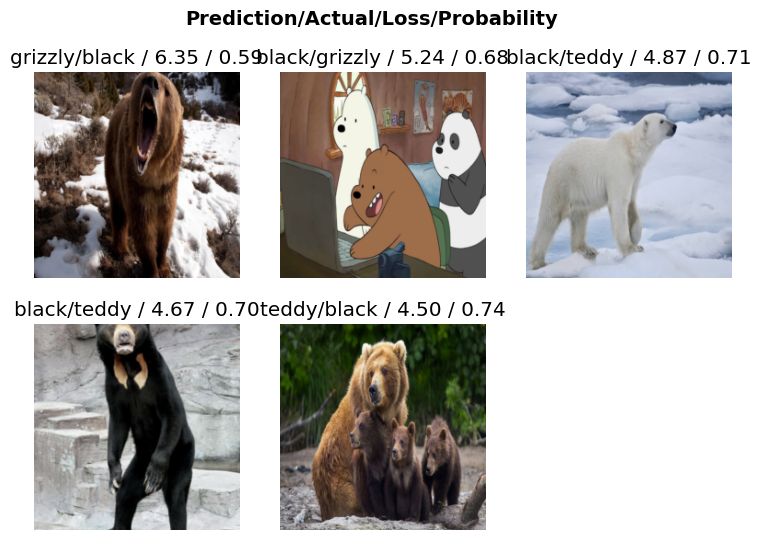

In [51]:
interp.plot_top_losses(5, nrows=2)

In [55]:
from fastai.vision.widgets import *

cleaner = ImageClassifierCleaner(learn)

In [56]:
cleaner

Turning Model into an Online App

In [57]:
learn.export()

In [59]:
path = Path()
path.ls(file_exts=".pkl")

(#1) [Path('export.pkl')]

In [60]:
learn_inf = load_learner(path/"export.pkl")

In [61]:
learn_inf.predict("images/grizzly.jpg")

('black', tensor(0), tensor([0.3739, 0.2581, 0.3680]))

In [63]:
learn_inf.dls.vocab

['black', 'grizzly', 'teddy']

In [64]:
btn_upload = widgets.FileUpload()

In [65]:
btn_upload

FileUpload(value={}, description='Upload')

In [66]:
img = PILImage.create(btn_upload.data[-1])

In [67]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128, 128))
out_pl

Output()

In [68]:
pred, pred_idx, probs = learn_inf.predict(img)

In [70]:
lbl_pred = widgets.Label()
lbl_pred.value = f"Prediction: {pred}; Probability: {probs[pred_idx]:.04f}"
lbl_pred

Label(value='Prediction: grizzly; Probability: 0.7074')

In [71]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [72]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [73]:
VBox([widgets.Label('Select your bear!'),
      btn_upload, btn_run, out_pl, lbl_pred])